In [ ]:
 !pip install --upgrade tensorflow_hub

In [1]:
import os
import pathlib
import random
import numpy as np
import matplotlib.pyplot as plt

import zipfile
import requests
import glob as glob

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten
from tensorflow.keras.utils import image_dataset_from_directory

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter)
from dataclasses import dataclass

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from pathlib import Path
import imghdr

data_dir = "/content/drive/MyDrive/disease /valid/2"
image_extensions = [".png", ".jpg"]  # add there all your images file extensions

img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]
for filepath in Path(data_dir).rglob("*"):
    if filepath.suffix.lower() in image_extensions:
        img_type = imghdr.what(filepath)
        if img_type is None:
            print(f"{filepath} is not an image")
        elif img_type not in img_type_accepted_by_tf:
            print(f"{filepath} is a {img_type}, not accepted by TensorFlow")

In [ ]:
import pandas as pd
from collections import Counter

# Load the CSV file into a DataFrame
csv_file = '/content/test (1).csv'  # Replace with the path to your CSV file
df = pd.read_csv(csv_file)

# Extract the file paths from the "Image_Path" column
file_paths = df['image_relpath']

# Initialize a Counter to count the extensions
extension_counter = Counter()

# Count the occurrences of each extension
for file_path in file_paths:
    extension = file_path.split('.')[-1]
    extension_counter[extension] += 1

# Print the count of each extension
for extension, count in extension_counter.items():
    print(f"Extension: {extension}, Count: {count}")


Extension: png, Count: 291
Extension: jpg, Count: 180


In [3]:
import pandas as pd

# Load the CSV file into a DataFrame
csv_file = '/content/test (1).csv'  # Replace with the path to your CSV file
df = pd.read_csv(csv_file)

# Sort the DataFrame based on the "Image_Path" column
df_sorted = df.sort_values(by="image_relpath")

# Save the sorted DataFrame back to a CSV file
sorted_csv_file = 'sorted_data.csv'  # Replace with the desired output file name
df_sorted.to_csv(sorted_csv_file, index=False)

print(f'CSV file "{sorted_csv_file}" has been sorted and saved.')


CSV file "sorted_data.csv" has been sorted and saved.


In [3]:

@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES: int = 3
    IMG_HEIGHT:  int = 224
    IMG_WIDTH:   int = 224
    CHANNELS:    int = 3

    DATA_ROOT_TRAIN:  str = "/content/drive/MyDrive/disease /train"
    DATA_ROOT_VALID:  str = '/content/drive/MyDrive/disease /valid'
    DATA_ROOT_TEST:   str = '/content/drive/MyDrive/disease /test'
    DATA_ROOT_TESTING: str = '/content/drive/MyDrive/disease /testing'
    DATA_TEST_GT:     str = "/content/sorted_data.csv"

@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:       int   = 32
    EPOCHS:           int   = 20
    LEARNING_RATE:    float = 0.0001
    DROPOUT:          float = 0.6
    LAYERS_FINE_TUNE: int   = 8

In [10]:
train_dataset = image_dataset_from_directory(directory=DatasetConfig.DATA_ROOT_TRAIN,
                                             batch_size=TrainingConfig.BATCH_SIZE,
                                             shuffle=True,
                                             seed=42,
                                             label_mode='int',        # Use integer encoding
                                             image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                            )

valid_dataset = image_dataset_from_directory(directory=DatasetConfig.DATA_ROOT_VALID,
                                             batch_size=TrainingConfig.BATCH_SIZE,
                                             shuffle=True,
                                             seed=42,
                                             label_mode='int',        # Use integer encoding
                                             image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                            )

Found 2292 files belonging to 3 classes.
Found 466 files belonging to 3 classes.


In [ ]:
print(train_dataset.class_names)

['0', '1', '2']


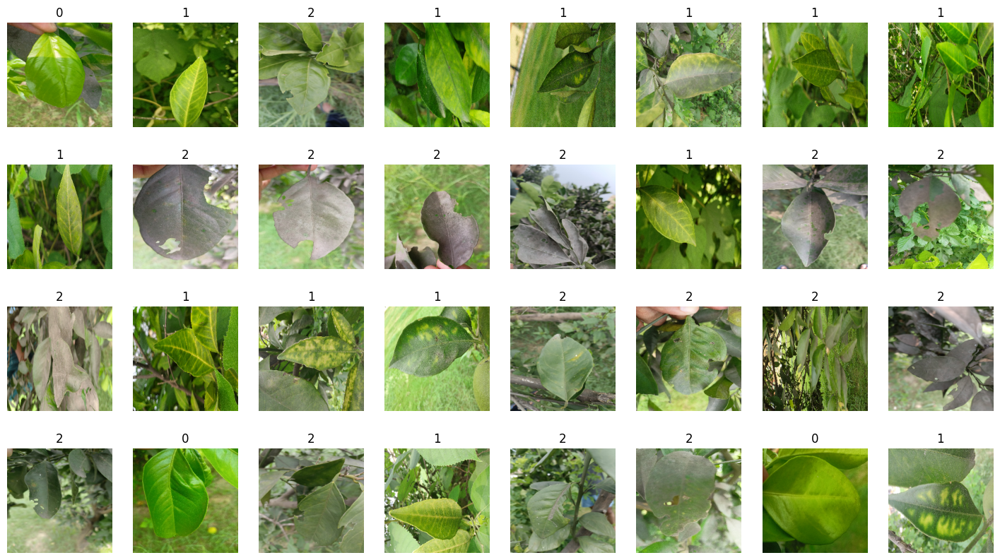

In [11]:
class_names = train_dataset.class_names

plt.figure(figsize=(18,10))

# Assumes dataset batch_size is at least 32.
num_rows = 4
num_cols = 8

# Here we use the take() method to retrieve just the first batch of data from the training portion of the dataset.
for image_batch, labels_batch in train_dataset.take(1):

    # Plot each of the images in the batch and the associated ground truth labels.
    for i in range(num_rows*num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        truth_idx = labels_batch[i].numpy()
        plt.title(class_names[truth_idx])
        plt.axis("off")

In [ ]:
import pandas as pd

input_file = DatasetConfig.DATA_TEST_GT

dataset = pd.read_csv(input_file)
df = pd.DataFrame(dataset)
cols = [1]
df = df[df.columns[cols]]
ground_truth_ids = df['target'].values.tolist()
print("Total number of Test labels: ", len(ground_truth_ids))
print(len(ground_truth_ids))
print(ground_truth_ids[50:60])

Total number of Test labels:  471
471
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2]


In [ ]:
print(train_dataset.class_names)

['0', '1', '2']


In [ ]:
class_names_int = list(map(int, train_dataset.class_names))

# Create a dictionary mapping ground truth IDs to class name IDs.
gtid_2_cnidx = dict(zip(class_names_int, range(0,DatasetConfig.NUM_CLASSES)))

gtid_2_cnidx.items()


dict_items([(0, 0), (1, 1), (2, 2)])

In [ ]:
label_ids = []
for idx in range(len(ground_truth_ids)):
    label_ids.append(gtid_2_cnidx[ground_truth_ids[idx]])

print('Original ground truth class IDs: ',ground_truth_ids[0:10])
print('New mapping required:            ',label_ids[0:10])

print('')
print('Train/Valid dataset class names: ',train_dataset.class_names)
print(len(label_ids))
print(label_ids)

Original ground truth class IDs:  [2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
New mapping required:             [2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Train/Valid dataset class names:  ['0', '1', '2']
471
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1

In [ ]:
image_paths = sorted(glob.glob(DatasetConfig.DATA_ROOT_TEST + '/*.[pj][np][ge]*'))


print(len(image_paths))
print('')
print(image_paths)
# Print the first 5 image paths to confirm.
for idx in range(20):
    print(image_paths[idx])

471

['/content/drive/MyDrive/disease /test/IMG20220910102620.jpg', '/content/drive/MyDrive/disease /test/IMG20220910103037 (1).jpg', '/content/drive/MyDrive/disease /test/IMG20220910103635.jpg', '/content/drive/MyDrive/disease /test/IMG20220910103908.jpg', '/content/drive/MyDrive/disease /test/IMG20220910104743.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114637_BURST001_COVER.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114637_BURST003.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114832_BURST003.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114901_BURST004.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114901_BURST007.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114914_BURST004.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114914_BURST006.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114914_BURST007.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114946_BURST002.jpg', '/content/drive/MyDrive/disease /te

In [ ]:

test_dataset = tf.data.Dataset.from_tensor_slices((image_paths, label_ids))

In [ ]:
def preprocess_image(image):
    # Decode and resize image.
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, [DatasetConfig.IMG_WIDTH, DatasetConfig.IMG_HEIGHT])
    return image

In [ ]:
def load_and_preprocess_image(path):
    # Read image into memory as a byte string.
    image = tf.io.read_file(path)
    return preprocess_image(image)

In [ ]:
def load_and_preprocess_from_path_label(path, label):
    return load_and_preprocess_image(path), label

In [ ]:
test_dataset = test_dataset.map(load_and_preprocess_from_path_label)

# Set the batch size for the dataset.
test_dataset = test_dataset.batch(TrainingConfig.BATCH_SIZE)

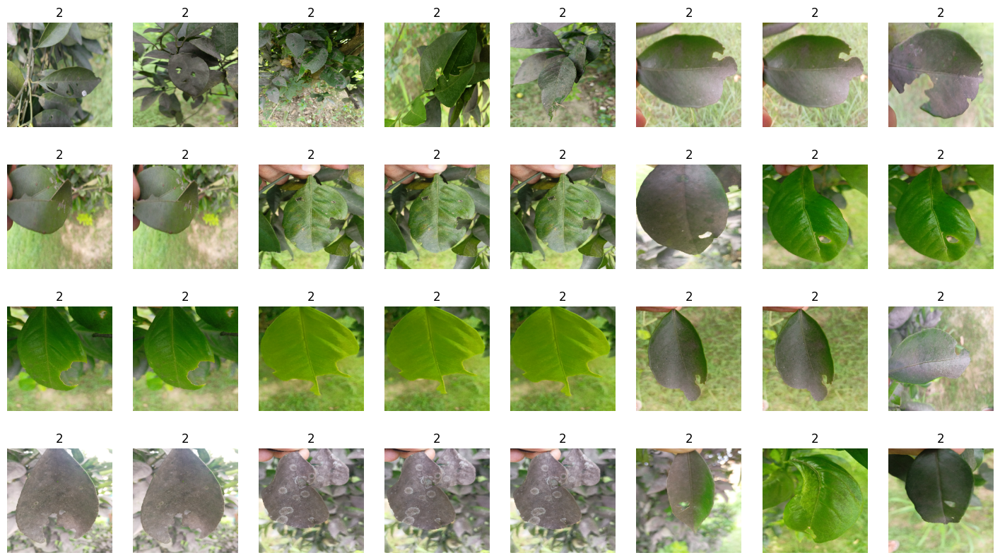

In [ ]:
plt.figure(figsize=(18,10))

# Assumes dataset batch_size is at least 32.
num_rows = 4
num_cols = 8

# Here we use the take() method to retrieve just the first batch of data from the test dataset.
for image_batch, labels_batch in test_dataset.take(1):

    # Plot each of the images in the batch and the associated ground truth labels.
    for i in range(num_rows*num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        truth_idx = labels_batch[i].numpy()
        plt.title(class_names[truth_idx])
        plt.axis("off")

In [ ]:
input_shape = (DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH, DatasetConfig.CHANNELS)

print('Loading model with ImageNet weights...')
resnet_conv_base = tf.keras.applications.ResNet50V2(input_shape=input_shape,
                                                    include_top=False, # We will supply our own top.
                                                    weights='imagenet',
                                                   )
print(resnet_conv_base.summary())

Loading model with ImageNet weights...
Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_8[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                  

In [ ]:
resnet_conv_base.trainable = True

# Specify the number of layers to fine tune at the end of the convolutional base.
num_layers_fine_tune = 10
num_layers = len(resnet_conv_base.layers)
print(num_layers)
# Freeze the initial layers in the convolutional base.
#for model_layer in resnet_conv_base.layers[:num_layers - num_layers_fine_tune]:
#    print(f"FREEZING LAYER: {model_layer}")
#    model_layer.trainable = False

#print("\n")
#print(f"Configured to fine tune the last", num_layers_fine_tune, "convolutional layers...")
#print("\n")

#print(resnet_conv_base.summary())

190


In [ ]:
inputs = tf.keras.Input(shape=input_shape)

x = tf.keras.applications.resnet.preprocess_input(inputs)

x = resnet_conv_base(x)

x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(TrainingConfig.DROPOUT)(x)

# The final `Dense` layer with the number of classes.
outputs = layers.Dense(DatasetConfig.NUM_CLASSES, activation='softmax')(x)

# The final model.
model_vgg16_finetune = keras.Model(inputs, outputs)

print(model_vgg16_finetune.summary())

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem_2  (None, 224, 224, 3)       0         
  (SlicingOpLambda)                                              
                                                                 
 tf.nn.bias_add_2 (TFOpLamb  (None, 224, 224, 3)       0         
 da)                                                             
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten_3 (Flatten)         (None, 100352)            0         
                                                                 
 dense_6 (Dense)             (None, 128)               1284

In [ ]:
model_vgg16_finetune.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=TrainingConfig.LEARNING_RATE),
                    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                    metrics=['accuracy'],
                   )

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [ ]:
training_results = model_vgg16_finetune.fit(train_dataset,
                                            epochs=TrainingConfig.EPOCHS,
                                            validation_data=valid_dataset,
                                            callbacks=[callback],
                                           )

Epoch 1/20
72/72 [==============================] - 160s 2s/step - loss: 0.0313 - accuracy: 0.9900 - val_loss: 0.0643 - val_accuracy: 0.9850
Epoch 2/20
72/72 [==============================] - 166s 2s/step - loss: 0.0192 - accuracy: 0.9935 - val_loss: 0.0364 - val_accuracy: 0.9871
Epoch 3/20
72/72 [==============================] - 165s 2s/step - loss: 0.0053 - accuracy: 0.9987 - val_loss: 0.0311 - val_accuracy: 0.9914
Epoch 4/20
72/72 [==============================] - 165s 2s/step - loss: 0.0044 - accuracy: 0.9987 - val_loss: 0.0479 - val_accuracy: 0.9893
Epoch 5/20
72/72 [==============================] - 159s 2s/step - loss: 0.0061 - accuracy: 0.9978 - val_loss: 0.0397 - val_accuracy: 0.9936
Epoch 6/20
72/72 [==============================] - 158s 2s/step - loss: 0.0058 - accuracy: 0.9987 - val_loss: 0.0714 - val_accuracy: 0.9807
Epoch 7/20
72/72 [==============================] - 177s 2s/step - loss: 0.0040 - accuracy: 0.9987 - val_loss: 0.0759 - val_accuracy: 0.9828
Epoch 8/20
72

In [ ]:
def plot_results(metrics, ylabel=None, ylim=None, metric_name=None, color=None):

    fig, ax = plt.subplots(figsize=(15, 4))

    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics,]
        metric_name = [metric_name,]

    for idx, metric in enumerate(metrics):
        ax.plot(metric, color=color[idx])

    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(ylabel)
    plt.xlim([0, TrainingConfig.EPOCHS-1])
    plt.ylim(ylim)
    # Tailor x-axis tick marks
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)
    plt.show()
    plt.close()

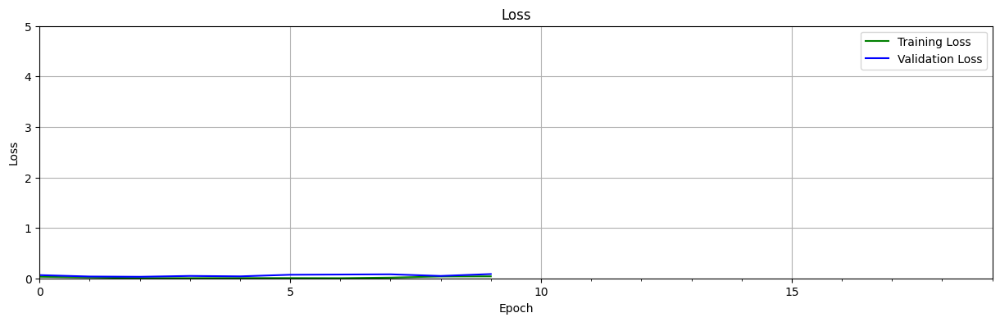

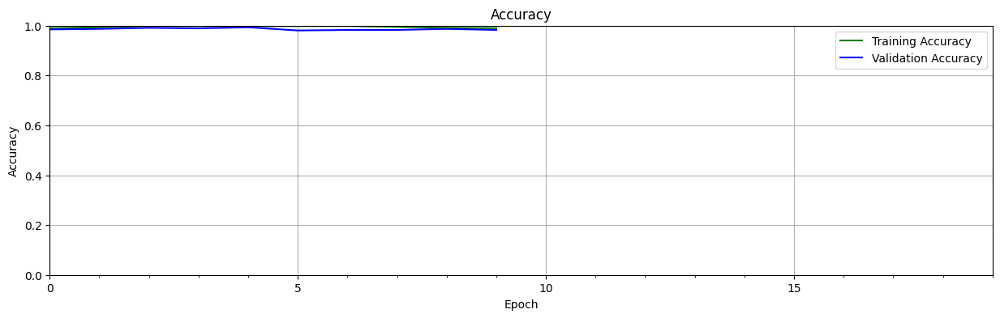

In [ ]:
train_loss = training_results.history["loss"]
train_acc  = training_results.history["accuracy"]
valid_loss = training_results.history["val_loss"]
valid_acc  = training_results.history["val_accuracy"]

plot_results([ train_loss, valid_loss ],
            ylabel="Loss",
            ylim = [0.0, 5.0],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

plot_results([ train_acc, valid_acc ],
            ylabel="Accuracy",
            ylim = [0.0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

In [14]:
def display_predictions(dataset, model, class_names):

    plt.figure(figsize=(20,20))
    num_rows = 8
    num_cols = 8
    jdx = 0

    # Evaluate all the batches.
    for image_batch, labels_batch in dataset.take(2):

        print(image_batch.shape)

        # Predictions for the current batch.
        predictions = model.predict(image_batch)

        # Loop over all the images in the current batch.
        for idx in range(len(labels_batch)):

            pred_idx = tf.argmax(predictions[idx]).numpy()
            truth_idx = labels_batch[idx].numpy()

            # Set the title color based on the prediction.
            if pred_idx == truth_idx:
                color='g'
            else:
                color='r'

            jdx += 1

            if jdx > num_rows*num_cols:
                # Break from the loops if the maximum number of images have been plotted
                break

            ax = plt.subplot(num_rows, num_cols, jdx)
            title = str(class_names[truth_idx]) + " : " + str(class_names[pred_idx])

            title_obj = plt.title(title)
            plt.setp(title_obj, color=color)
            plt.axis("off")
            plt.imshow(image_batch[idx].numpy().astype("uint8"));
    return

(32, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
(32, 224, 224, 3)
1/1 [==============================] - 0s 71ms/step


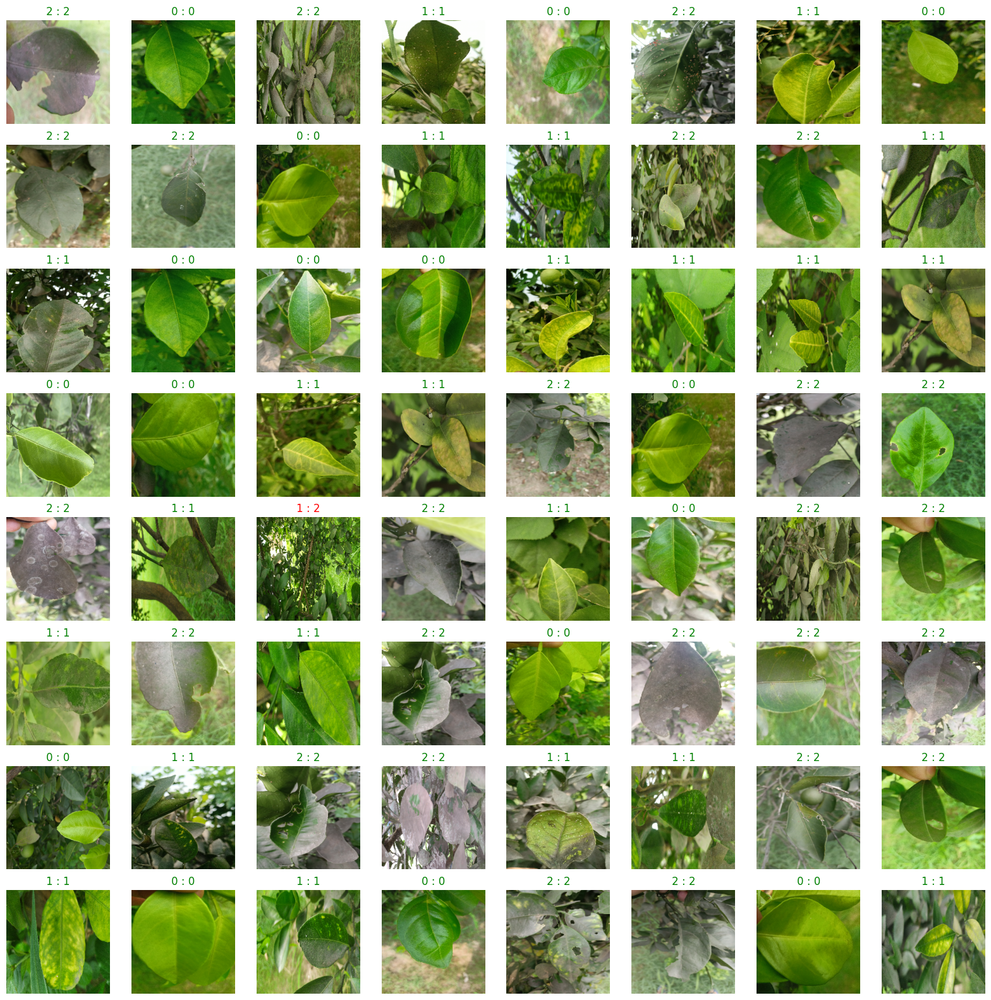

In [ ]:
display_predictions(valid_dataset, model_vgg16_finetune, class_names)

(32, 224, 224, 3)
1/1 [==============================] - 0s 263ms/step
(32, 224, 224, 3)
1/1 [==============================] - 0s 71ms/step


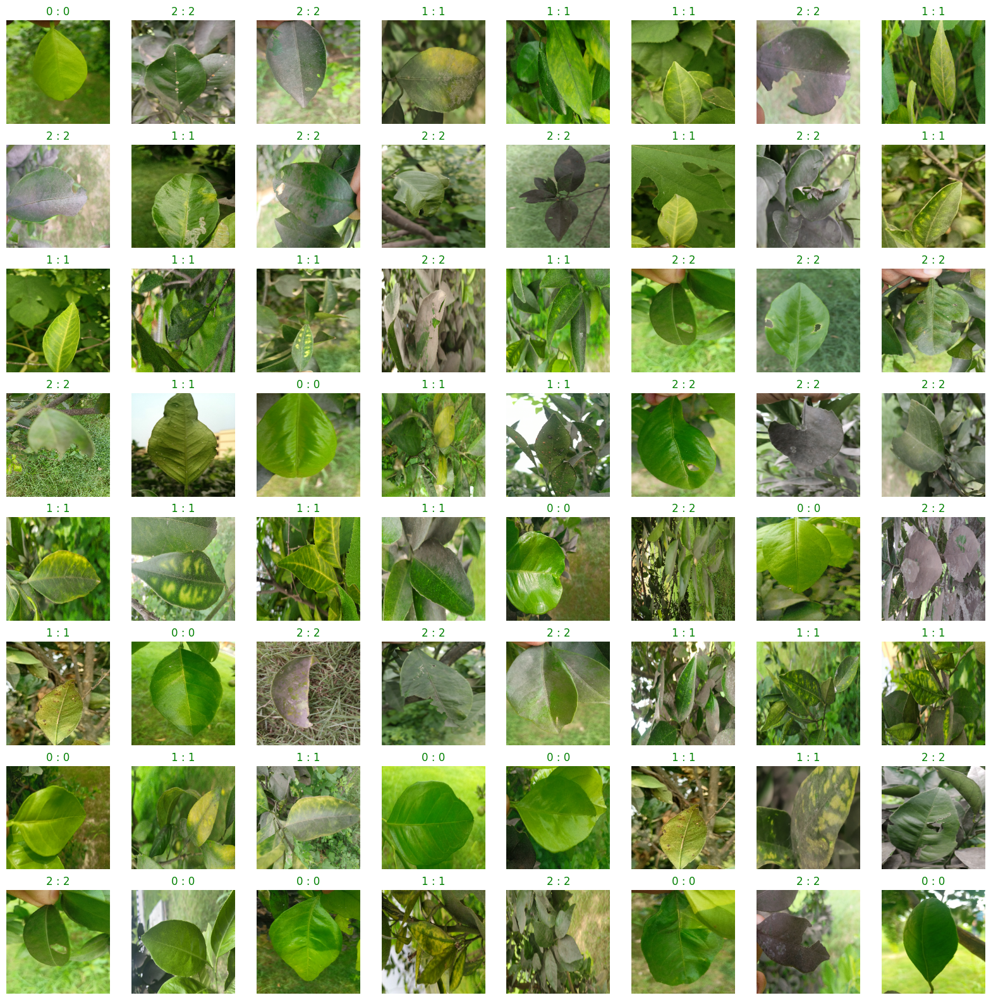

In [ ]:
display_predictions(train_dataset, model_vgg16_finetune, class_names)

In [ ]:
print(f"Model valid accuracy: {model_vgg16_finetune.evaluate(valid_dataset)[1]*100.:.3f}")


15/15 [==============================] - 26s 728ms/step - loss: 0.0852 - accuracy: 0.9828
Model valid accuracy: 98.283


In [ ]:
print(f"Model test accuracy: {model_vgg16_finetune.evaluate(test_dataset)[1]*100.:.3f}")


15/15 [==============================] - 23s 1s/step - loss: 0.0157 - accuracy: 0.9979
Model test accuracy: 99.788


In [20]:
import tensorflow as tf

# Load the model from the SavedModel directory
loaded_model = tf.keras.models.load_model('/content/drive/MyDrive/my_model')


In [28]:
testing_dataset = image_dataset_from_directory(directory=DatasetConfig.DATA_ROOT_TESTING  ,
                                             batch_size=TrainingConfig.BATCH_SIZE,
                                             shuffle=True,
                                             seed=42,
                                             label_mode='int',        # Use integer encoding
                                             image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                            )

Found 9 files belonging to 3 classes.


In [29]:
class_names = testing_dataset.class_names

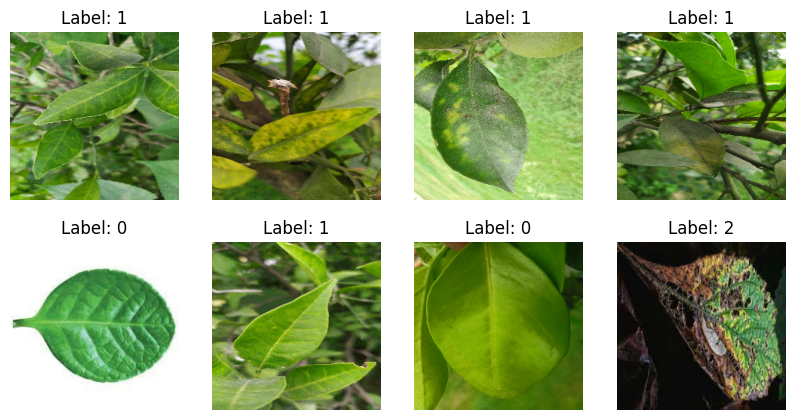

In [30]:
import tensorflow as tf
import matplotlib.pyplot as plt


def preprocess_image(image, label):

    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.rot90(image, k=1)



    return image, label




testing_dataset = testing_dataset.map(preprocess_image)


for images, labels in testing_dataset.take(1):
    plt.figure(figsize=(10, 5))
    for i in range(8):
        plt.subplot(2, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Label: {labels[i].numpy()}")
        plt.axis("off")

    plt.show()


In [26]:
print(testing_dataset.class_names)

AttributeError: ignored

In [27]:
class_names = testing_dataset.class_names

AttributeError: ignored

(9, 224, 224, 3)
1/1 [==============================] - 2s 2s/step


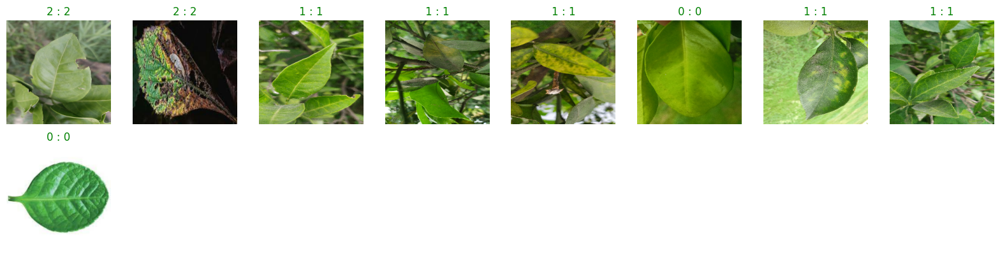

In [31]:
display_predictions(testing_dataset, loaded_model, class_names)

In [32]:
print(f"Model test accuracy: {loaded_model.evaluate(testing_dataset)[1]*100.:.3f}")

1/1 [==============================] - 3s 3s/step - loss: 0.7130 - accuracy: 0.6667
Model test accuracy: 66.667
